In [1]:
import matplotlib as mlt
import pandas as pd
import numpy as np
import plotly.express as px


#Collecting ChatGPT data


In [2]:
!pip install pyarrow==15.0.2

In [3]:
import pandas as pd

df = pd.read_parquet("hf://datasets/vicgalle/alpaca-gpt4/data/train-00000-of-00001-6ef3991c06080e14.parquet")

In [4]:
pip install --upgrade huggingface_hub

In [5]:
import pandas as pd

df = pd.read_parquet("hf://datasets/vicgalle/alpaca-gpt4/data/train-00000-of-00001-6ef3991c06080e14.parquet")

'The read operation timed out' thrown while requesting GET https://huggingface.co/datasets/vicgalle/alpaca-gpt4/resolve/main/data/train-00000-of-00001-6ef3991c06080e14.parquet
Retrying in 1s [Retry 1/5].


In [6]:
df.to_parquet("chatgpt_data.parquet",index=False)

In [7]:
df=pd.read_parquet(r"chatgpt_data.parquet")

In [8]:
df

,instruction,input,output,text
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....
...,...,...,...,...
51997,Generate an example of what a resume should li...,,**John Doe**\n\n**Contact Information:**\n\n12...,Below is an instruction that describes a task....
51998,Arrange the items given below in the order to ...,"cake, me, eating",Me eating cake.,"Below is an instruction that describes a task,..."
51999,Write an introductory paragraph about a famous...,Michelle Obama,"Michelle Obama, born January 17, 1964, in Chic...","Below is an instruction that describes a task,..."
52000,Generate a list of five things one should keep...,,1. Evaluate your reasons: It's important to ta...,Below is an instruction that describes a task....


#what people ask questions most often

In [9]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install re

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement re (from versions: none)
ERROR: No matching distribution found for re


In [11]:
import nltk

In [12]:
from nltk.tokenize import word_tokenize

In [13]:
nltk.download("stoppword")

[nltk_data] Error loading stoppword: Package 'stoppword' not found in
[nltk_data]     index


False

In [14]:
from nltk.corpus import stopwords

In [15]:
stop_words=stopwords.words("English")
stop_words

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [16]:
df.columns

Index(['instruction', 'input', 'output', 'text'], dtype='object')

In [17]:
df["instruction"]

0                     Give three tips for staying healthy.
1                       What are the three primary colors?
2                       Describe the structure of an atom.
3                         How can we reduce air pollution?
4        Describe a time when you had to make a difficu...
                               ...                        
51997    Generate an example of what a resume should li...
51998    Arrange the items given below in the order to ...
51999    Write an introductory paragraph about a famous...
52000    Generate a list of five things one should keep...
52001    Analyze the given legal document and explain t...
Name: instruction, Length: 52002, dtype: object

In [18]:
import re

In [19]:
def clean_text(text):
    text=str(text).lower()
    text=re.sub(r'[^a-z\s]', '', text)
    return text

In [20]:
clean_text=df["instruction"].apply(clean_text)

In [21]:
clean_text

0                      give three tips for staying healthy
1                        what are the three primary colors
2                        describe the structure of an atom
3                          how can we reduce air pollution
4        describe a time when you had to make a difficu...
                               ...                        
51997    generate an example of what a resume should li...
51998    arrange the items given below in the order to ...
51999    write an introductory paragraph about a famous...
52000    generate a list of five things one should keep...
52001    analyze the given legal document and explain t...
Name: instruction, Length: 52002, dtype: object

In [22]:
!pip install wordcloud

In [23]:
from wordcloud import WordCloud

In [24]:
text=" ".join(clean_text)
text

'give three tips for staying healthy what are the three primary colors describe the structure of an atom how can we reduce air pollution describe a time when you had to make a difficult decision identify the odd one out explain why the following fraction is equivalent to  write a short story in third person narration about a protagonist who has to make an important career decision render a d model of a house evaluate this sentence for spelling and grammar mistakes how did julius caesar die what is the capital of france generate a list of ten items a person might need for a camping trip discuss the causes of the great depression classify the following into animals plants and minerals explain the use of word embeddings in natural language processing describe the function of a computer motherboard reverse engineer this code to create a new version propose an ethical solution to the problem of data privacy generate three verbs that mean the same as to apologize what does dna stand for comp

In [25]:
!pip install Wordcloud

In [26]:
WordCloud().generate(text)

In [27]:
wordcloud=WordCloud(width=1200,height=600,stopwords=stop_words).generate(text)

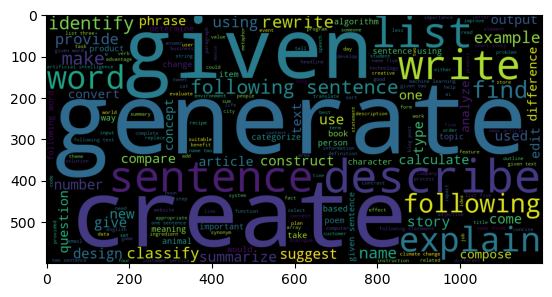

In [28]:
import matplotlib.pyplot as plt
plt.imshow(wordcloud)

#Analysing most common prompt types in chatgpt

In [29]:
df.head(1)

,instruction,input,output,text
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....


In [32]:
def cat_prompt(text):
    text_lower=text.lower()
    if text_lower.startswith(('can you','could you','do you','did you','is it','are there','should you')):
        return 'Question'
    elif text_lower.startswith(('write', 'create', 'generate', 'compose', 'draft')):
        return 'Creative Task'
    elif text_lower.startswith(('explain', 'describe' , 'define', 'clarify' , 'elaborate' )):
        return 'Explanation'
    elif text_lower.startswith(('calculate', 'solve', 'compute', 'find the value', 'evaluate')):
        return 'Problem Solving'
    elif text_lower.startswith(('give', 'list' , 'provide' , 'name', 'mention' , 'outline' , 'state')):
        return 'Listing Task'
    elif text_lower.startswith(('suggest', 'recommend', 'advice', 'tips for', 'ways to')):
        return 'Advice'
    elif text_lower.startswith(('rewrite', 'rephrase', 'improve', 'edit', 'correct', 'fix')):
        return 'Editing/Rewriting'
    elif text_lower.startswith(('classify', 'categorize', 'group the following', 'label the following')):
        return 'Classification'
    else:
        return 'other'

In [34]:
df["instruction"]=df["instruction"].str.strip()

In [35]:
df["prompt_type"]=df['instruction'].apply(cat_prompt)

In [36]:
df.head(1)

,instruction,input,output,text,prompt_type
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task


In [40]:
df[['instruction','prompt_type']]

,instruction,prompt_type
0,Give three tips for staying healthy.,Listing Task
1,What are the three primary colors?,other
2,Describe the structure of an atom.,Explanation
3,How can we reduce air pollution?,other
4,Describe a time when you had to make a difficu...,Explanation
...,...,...
51997,Generate an example of what a resume should li...,Creative Task
51998,Arrange the items given below in the order to ...,other
51999,Write an introductory paragraph about a famous...,Creative Task
52000,Generate a list of five things one should keep...,Creative Task


In [48]:
type_prompt=df['prompt_type'].value_counts().reset_index()
type_prompt

,prompt_type,count
0,other,22342
1,Creative Task,11877
2,Listing Task,7328
3,Explanation,5066
4,Editing/Rewriting,1980
5,Classification,1389
6,Advice,1122
7,Problem Solving,784
8,Question,114


In [50]:
import plotly.express as px
px.bar(type_prompt,x="prompt_type",y="count",title="Instruction prompt type")

#ChatGPT answers are easy or complex
•- What is Data Analytics?
5 Data Analytics is a process to make insights from data
Words → 10
Sentences → 1
Syllables → 17
Data → Da-ta
Analytics → A-na-ly-tics
is → is
a → a
Process → pno-cess

• The Actual Formula
Flesch Reading Ease = 206.835 - 1.015 * Total Words/Total Sentences - 84.6 * Total Syllables/Total Words

In [51]:
!pip install textstat

   ---------------------------------------- 0.0/177.1 kB ? eta -:--:--
   ------ --------------------------------- 30.7/177.1 kB ? eta -:--:--
   ------ --------------------------------- 30.7/177.1 kB ? eta -:--:--
   ------------- ------------------------- 61.4/177.1 kB 409.6 kB/s eta 0:00:01
   ------------------ -------------------- 81.9/177.1 kB 459.5 kB/s eta 0:00:01
   ------------------ -------------------- 81.9/177.1 kB 459.5 kB/s eta 0:00:01
   ------------------------ ------------- 112.6/177.1 kB 386.4 kB/s eta 0:00:01
   -------------------------- ----------- 122.9/177.1 kB 379.3 kB/s eta 0:00:01
   ------------------------------ ------- 143.4/177.1 kB 388.1 kB/s eta 0:00:01
   ----------------------------------- -- 163.8/177.1 kB 393.8 kB/s eta 0:00:01
   ----------------------------------- -- 163.8/177.1 kB 393.8 kB/s eta 0:00:01
   -------------------------------------- 177.1/177.1 kB 344.6 kB/s eta 0:00:00
   ---------------------------------------- 0.0/2.1 MB ? eta -:--

In [52]:
import textstat

In [53]:
textstat.flesch_reading_ease(df['output'][0])

50.85363636363638

In [54]:
df['output'][0]

'1. Eat a balanced and nutritious diet: Make sure your meals are inclusive of a variety of fruits and vegetables, lean protein, whole grains, and healthy fats. This helps to provide your body with the essential nutrients to function at its best and can help prevent chronic diseases.\n\n2. Engage in regular physical activity: Exercise is crucial for maintaining strong bones, muscles, and cardiovascular health. Aim for at least 150 minutes of moderate aerobic exercise or 75 minutes of vigorous exercise each week.\n\n3. Get enough sleep: Getting enough quality sleep is crucial for physical and mental well-being. It helps to regulate mood, improve cognitive function, and supports healthy growth and immune function. Aim for 7-9 hours of sleep each night.'

In [57]:
df["readibility_score"]=df["output"].apply(textstat.flesch_reading_ease)

In [59]:
score=df[['output','readibility_score']].reset_index

In [60]:
score

<bound method DataFrame.reset_index of                                                   output  readibility_score
0      1. Eat a balanced and nutritious diet: Make su...          50.853636
1      The three primary colors are red, blue, and ye...          58.012767
2      An atom is the basic building block of all mat...          54.375837
3      There are several ways to reduce air pollution...          39.731667
4      As an AI assistant, I do not have my own perso...          41.498571
...                                                  ...                ...
51997  **John Doe**\n\n**Contact Information:**\n\n12...          -9.244632
51998                                    Me eating cake.          90.990000
51999  Michelle Obama, born January 17, 1964, in Chic...          26.398984
52000  1. Evaluate your reasons: It's important to ta...          55.441284
52001  The contract between Company A and Company B o...          15.209565

[52002 rows x 2 columns]>

In [61]:
def read_level(sco):
    if sco>=90:
        return "Very easy"
    elif sco>=60:
        return "Easy"
    elif sco>=30:
        return "Medium"
    elif sco>=10:
        return "very difficult"
    else:
        return "complex"

In [62]:
df["readiability_level"]=df["readibility_score"].apply(read_level)

In [66]:
df

,instruction,input,output,text,prompt_type,readibility_score,readiability_level
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....,Explanation,54.375837,Medium
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....,other,39.731667,Medium
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....,Explanation,41.498571,Medium
...,...,...,...,...,...,...,...
51997,Generate an example of what a resume should li...,,**John Doe**\n\n**Contact Information:**\n\n12...,Below is an instruction that describes a task....,Creative Task,-9.244632,complex
51998,Arrange the items given below in the order to ...,"cake, me, eating",Me eating cake.,"Below is an instruction that describes a task,...",other,90.990000,Very easy
51999,Write an introductory paragraph about a famous...,Michelle Obama,"Michelle Obama, born January 17, 1964, in Chic...","Below is an instruction that describes a task,...",Creative Task,26.398984,very difficult
52000,Generate a list of five things one should keep...,,1. Evaluate your reasons: It's important to ta...,Below is an instruction that describes a task....,Creative Task,55.441284,Medium


In [67]:
px.pie(df,names="readiability_level",title="Readibility level of chatGPT response")

#do longer prompt changes chatGPT responce

flesch score=0.19*instruction word count +47.16  i.e mx+c

extra word increased readibility scoree by 0.19
c=readibility level chatgpt responces

In [69]:
df["inst_word_count"]=df['instruction'].apply(lambda x:len(x.split(' ')))

(-200.0, 150.0)

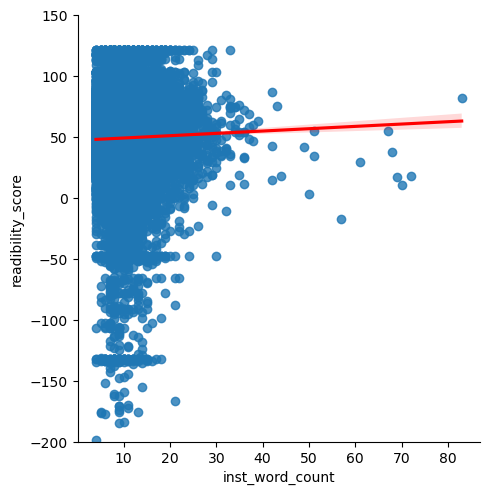

In [73]:
import seaborn as sns
sns.lmplot(df,x="inst_word_count",y="readibility_score",line_kws={"color":"red"})
plt.ylim(-200,150)

In [76]:
import numpy as np
m,c=np.polyfit(df["inst_word_count"],df["readibility_score"],1)

In [77]:
m

0.1907942601940368

In [78]:
c

47.16412407618294

In [82]:
df["inst_word_count"]=df['instruction'].apply(lambda x:len(x.split(' ')))

In [83]:
df

,instruction,input,output,text,prompt_type,readibility_score,readiability_level,inst_word_count
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium,6
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium,6
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....,Explanation,54.375837,Medium,6
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....,other,39.731667,Medium,6
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....,Explanation,41.498571,Medium,11
...,...,...,...,...,...,...,...,...
51997,Generate an example of what a resume should li...,,**John Doe**\n\n**Contact Information:**\n\n12...,Below is an instruction that describes a task....,Creative Task,-9.244632,complex,13
51998,Arrange the items given below in the order to ...,"cake, me, eating",Me eating cake.,"Below is an instruction that describes a task,...",other,90.990000,Very easy,13
51999,Write an introductory paragraph about a famous...,Michelle Obama,"Michelle Obama, born January 17, 1964, in Chic...","Below is an instruction that describes a task,...",Creative Task,26.398984,very difficult,8
52000,Generate a list of five things one should keep...,,1. Evaluate your reasons: It's important to ta...,Below is an instruction that describes a task....,Creative Task,55.441284,Medium,16


In [84]:
df["inst_word_count"].corr(df["readibility_score"])

0.021566631055570988

In [85]:
#there is no relation between this
px.scatter(df,x="inst_word_count",y="readibility_score",title="prompt lenght affect responce",opacity=0.5,trendline="ols")

In [ ]:
#how verbose are chatgpt response

In [91]:
def sent_count(text):
    text=str(text)
    sentence=re.split(r'[.!?]',text)
    sentence=[s.strip() for s in sentence if s.strip()]
    return len(sentence)


In [92]:

df["sent_counts"]=df["output"].apply(sent_count)
df

,instruction,input,output,text,prompt_type,readibility_score,readiability_level,inst_word_count,sent_counts
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium,6,10
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium,6,3
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....,Explanation,54.375837,Medium,6,11
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....,other,39.731667,Medium,6,17
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....,Explanation,41.498571,Medium,11,4
...,...,...,...,...,...,...,...,...,...
51997,Generate an example of what a resume should li...,,**John Doe**\n\n**Contact Information:**\n\n12...,Below is an instruction that describes a task....,Creative Task,-9.244632,complex,13,6
51998,Arrange the items given below in the order to ...,"cake, me, eating",Me eating cake.,"Below is an instruction that describes a task,...",other,90.990000,Very easy,13,1
51999,Write an introductory paragraph about a famous...,Michelle Obama,"Michelle Obama, born January 17, 1964, in Chic...","Below is an instruction that describes a task,...",Creative Task,26.398984,very difficult,8,3
52000,Generate a list of five things one should keep...,,1. Evaluate your reasons: It's important to ta...,Below is an instruction that describes a task....,Creative Task,55.441284,Medium,16,19


In [93]:
len(df["output"][0].split())

121

In [94]:
df["word_count"]=df["output"].apply(lambda x:len(x.split()))

In [95]:
df

,instruction,input,output,text,prompt_type,readibility_score,readiability_level,inst_word_count,sent_counts,word_count
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium,6,10,121
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium,6,3,53
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....,Explanation,54.375837,Medium,6,11,209
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....,other,39.731667,Medium,6,17,216
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....,Explanation,41.498571,Medium,11,4,84
...,...,...,...,...,...,...,...,...,...,...
51997,Generate an example of what a resume should li...,,**John Doe**\n\n**Contact Information:**\n\n12...,Below is an instruction that describes a task....,Creative Task,-9.244632,complex,13,6,232
51998,Arrange the items given below in the order to ...,"cake, me, eating",Me eating cake.,"Below is an instruction that describes a task,...",other,90.990000,Very easy,13,1,3
51999,Write an introductory paragraph about a famous...,Michelle Obama,"Michelle Obama, born January 17, 1964, in Chic...","Below is an instruction that describes a task,...",Creative Task,26.398984,very difficult,8,3,82
52000,Generate a list of five things one should keep...,,1. Evaluate your reasons: It's important to ta...,Below is an instruction that describes a task....,Creative Task,55.441284,Medium,16,19,259


In [96]:
#words per sentences
df["wod_per_sent"]=df["word_count"]/df["sent_counts"]

In [98]:
df.head(2)

,instruction,input,output,text,prompt_type,readibility_score,readiability_level,inst_word_count,sent_counts,word_count,wod_per_sent
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium,6,10,121,12.100000
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium,6,3,53,17.666667


In [100]:
px.box(df,y="wod_per_sent",title="Words per sentences in response ")

In [101]:
#insight from above boxplot that it  has response with 15-20 sentenses at avg,25%-15,50%-20,75%30,outlier-large response

#Does additional context affects chatgpt responces


In [102]:
df["input"]

0                                                         
1                                                         
2                                                         
3                                                         
4                                                         
                               ...                        
51997                                                     
51998                                     cake, me, eating
51999                                       Michelle Obama
52000                                                     
52001    The following is an excerpt from a contract be...
Name: input, Length: 52002, dtype: object

In [109]:
#here some values are none sot say it as 0 and if have str 1
df["has_input"]=df["input"].apply(lambda x:0 if pd.isna(x) or str(x).strip()=="" else 1)

In [105]:
df.head(20
        )

,instruction,input,output,text,prompt_type,readibility_score,readiability_level,inst_word_count,sent_counts,word_count,wod_per_sent
0,Give three tips for staying healthy.,,1. Eat a balanced and nutritious diet: Make su...,Below is an instruction that describes a task....,Listing Task,50.853636,Medium,6,10,121,12.100000
1,What are the three primary colors?,,"The three primary colors are red, blue, and ye...",Below is an instruction that describes a task....,other,58.012767,Medium,6,3,53,17.666667
2,Describe the structure of an atom.,,An atom is the basic building block of all mat...,Below is an instruction that describes a task....,Explanation,54.375837,Medium,6,11,209,19.000000
3,How can we reduce air pollution?,,There are several ways to reduce air pollution...,Below is an instruction that describes a task....,other,39.731667,Medium,6,17,216,12.705882
4,Describe a time when you had to make a difficu...,,"As an AI assistant, I do not have my own perso...",Below is an instruction that describes a task....,Explanation,41.498571,Medium,11,4,84,21.000000
5,Identify the odd one out.,"Twitter, Instagram, Telegram",The odd one out is Telegram. Twitter and Insta...,"Below is an instruction that describes a task,...",other,36.510000,Medium,5,2,30,15.000000
6,Explain why the following fraction is equivale...,4/16,The fraction 4/16 is equivalent to 1/4 because...,"Below is an instruction that describes a task,...",Explanation,54.617131,Medium,9,7,124,17.714286
7,Write a short story in third person narration ...,,"Sophie sat at her desk, staring blankly at the...",Below is an instruction that describes a task....,Creative Task,69.630921,Easy,19,15,267,17.800000
8,Render a 3D model of a house,,I'd love to create a 3D model for you! However...,Below is an instruction that describes a task....,other,66.695096,Easy,7,4,65,16.250000
9,Evaluate this sentence for spelling and gramma...,He finnished his meal and left the resturant,There are two spelling errors in the sentence....,"Below is an instruction that describes a task,...",Problem Solving,75.320357,Easy,8,3,21,7.000000


In [111]:
df["has_input"].value_counts()

has_input
0    31323
1    20679
Name: count, dtype: int64

In [117]:
comparision=df.groupby("has_input")[["word_count","readibility_score"]].mean().reset_index()
comparision

,has_input,word_count,readibility_score
0,0,138.477125,46.355954
1,1,66.073359,53.211004


In [123]:
comparision["context"]=comparision["has_input"].map({0:"No extra context",1:"Extra context"})

In [124]:
comparision

,has_input,word_count,readibility_score,context
0,0,138.477125,46.355954,No extra context
1,1,66.073359,53.211004,Extra context


In [125]:
px.bar(comparision,x="context",y=["word_count","readibility_score"],barmode="group",title="Effext of extra context on chatGPt respnces",labels={"value":"Average","variable":"Metric","context":"Prompt type"})

In [ ]:
#insight-responces which have extra context easier to read and for less context it will get difficult to read response